In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
# sns.set(rc={'axes.grid':False})
import numpy as np
import torch, cv2, gdal, georaster
import sys, os, json, math
from pytorch_utils.eval import read_model, flip
from nbutils import thresh, score_pred, load_img, make_input_tensor, predict_on_file, get_saliency_big, plot_poly
from config import Config
from tqdm import tqdm
from abc import ABC, abstractmethod
import skimage.io as io
%matplotlib inline

In [2]:
class Dataset(ABC):
    def __init__(self, imdir, lbldir):
        self.imdir = imdir
        self.lbldir = lbldir
    
    @abstractmethod
    def _convert(self, im_name):
        """Converts a fname in self.imdir to a lblname in self.lbldir"""
    
    @abstractmethod
    def load_im(self, im_name):
        """Loads in an image, and does necessary preprocessing. Should return a wxh np array"""

    @abstractmethod
    def load_lbl(self, lbl_name):
        """Loads in lbl into a numpy array"""
    
    def __iter__(self):
        for name in os.listdir(self.imdir):
            imn = os.path.join(self.imdir, name)
            lbln = os.path.join(self.lbldir, self._convert(name))
            yield self.load_im(imn), self.load_lbl(lbln)
        
    def __len__(self):
        return len(os.listdir(self.lbldir))

def standardize(x):
    return x / (2047)

def apply_mask(matrix, mask, fill_value):
    masked = np.ma.array(matrix, mask=mask, fill_value=fill_value)
    return masked.filled()

def apply_threshold(matrix, low_value, high_value):
    low_mask = matrix < low_value
    matrix = apply_mask(matrix, low_mask, low_value)

    high_mask = matrix > high_value
    matrix = apply_mask(matrix, high_mask, high_value)
    return matrix

def load_tiff(fname):
    tiff = gdal.Open(fname, gdal.GA_ReadOnly)
    arr = [tiff.GetRasterBand(idx).ReadAsArray() for idx in range(1, tiff.RasterCount+1)]
    return np.dstack(arr)

class SpaceNetShanghai(Dataset):
    def __init__(self, imdir, lbldir):
        Dataset.__init__(self, imdir, lbldir)
        self.iprefix = "RGB-PanSharpen_AOI_4_Shanghai_"
        self.isuffix =  '.tif'
        self.lblprefix = 'buildings_AOI_4_Shanghai_'
        self.lblsuffix = '.geojson.npy'
    
    def simplest_cb(self, img, percent=1):
        """Colorbalances images
        taken from: https://gist.github.com/DavidYKay/9dad6c4ab0d8d7dbf3dc"""
        assert img.shape[2] == 3
        assert percent > 0 and percent < 100

        half_percent = percent / 200.0

        channels = cv2.split(img)

        out_channels = []
        for channel in channels:
            assert len(channel.shape) == 2
            # find the low and high precentile values (based on the input percentile)
            height, width = channel.shape
            vec_size = width * height
            flat = channel.reshape(vec_size)

            assert len(flat.shape) == 1

            flat = np.sort(flat)

            n_cols = flat.shape[0]

            low_val  = flat[int(math.floor(n_cols * half_percent))]
            high_val = flat[int(math.ceil( n_cols * (1.0 - half_percent)))]
            # saturate below the low percentile and above the high percentile
            thresholded = apply_threshold(channel, low_val, high_val)
            # scale the channel
            normalized = cv2.normalize(thresholded, thresholded.copy(), 0, 255, cv2.NORM_MINMAX)
            out_channels.append(normalized)

        return cv2.merge(out_channels)

    def two_sig(self, img, factor=2):
        """Drop the data outside of 2 sig range. Returns data in [0, 1] range"""
        h, w, ch = img.shape
        out_channels = []
        for i in range(ch):
            c_img = img[:,:,i]
            mean = c_img.mean()
            std = c_img.std()
            # Calculate 2 std above
            c_img = np.where(c_img > mean + factor*std, mean + factor*std, c_img)
            c_img = np.where(c_img < mean - factor*std, mean - factor*std, c_img)
    #         c_img = (c_img - mean + factor*std) / (2 * factor * std)
            c_img = cv2.normalize(c_img, c_img.copy(), 0, 1, cv2.NORM_MINMAX)
            out_channels.append(c_img)

        return cv2.merge(out_channels)

    def reg_scale(self, img):
        m, l = img.max(), img.min()
        return (img - l) / (m - l) * 255
    
    def load_im(self, im_name):
        """GTiff images, need colorbalancing"""
        return self.simplest_cb(load_tiff(im_name))
        
    def load_lbl(self, lbl_name):
        """Numpy based labels"""
        return np.load(lbl_name)
        
    def _convert(self, im_name):
        img_id = im_name.strip(self.isuffix)[len(self.iprefix):]
        return os.path.join(self.lbldir, self.lblprefix + img_id + self.lblsuffix)

In [3]:
class CrowdAI(Dataset):
    def __init__(self, imdir, lbldir):
        Dataset.__init__(self, imdir, lbldir)
    
    def _convert(self, im_name):
        return im_name.replace('jpg', 'npy')
    
    def load_lbl(self, lbl_name):
        return np.load(lbl_name)
    
    def load_im(self, im_name):
        return io.imread(im_name)
    

# Testing SpaceNet Shanghai Dataset

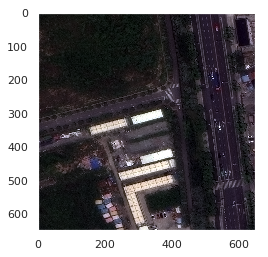

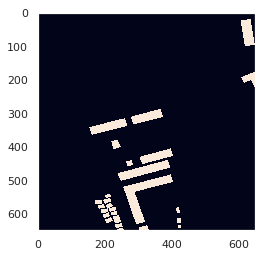

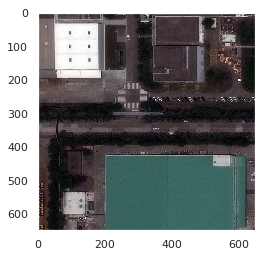

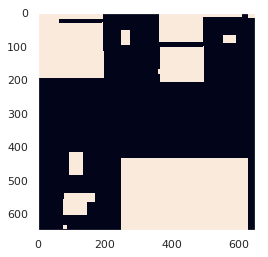

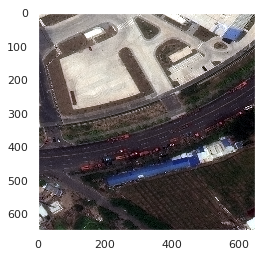

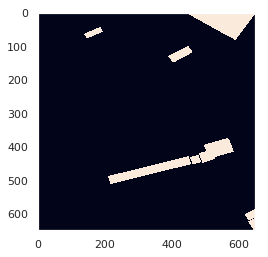

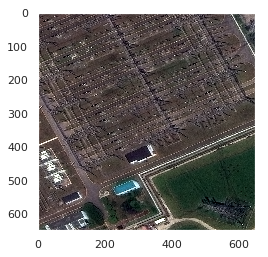

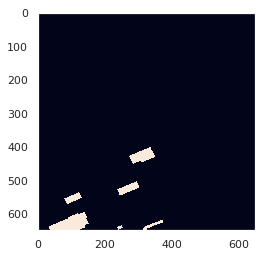

In [51]:
ddir = '/datasets/Shanghai/AOI_4_Shanghai_Train/'
spc = SpaceNetShanghai(ddir+'RGB-PanSharpen/', ddir+'Shanghai-Segs/')

for i, (x,y) in enumerate(spc):
    if i > 3:
        break
    plt.figure()
    plt.imshow(x)
    plt.figure()
    plt.imshow(y)

# Testing CrowdAI Dataset

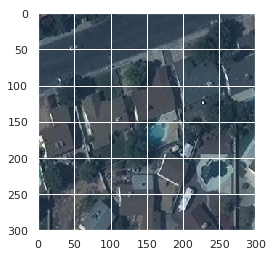

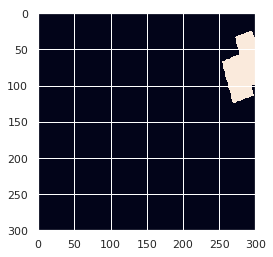

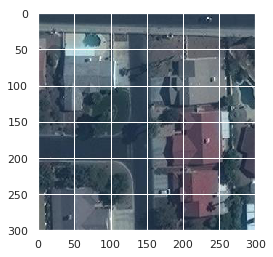

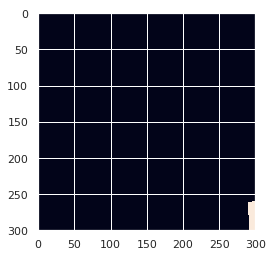

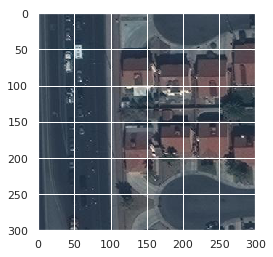

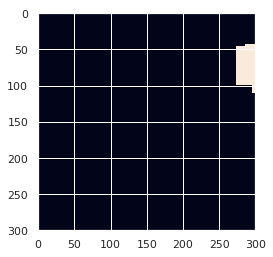

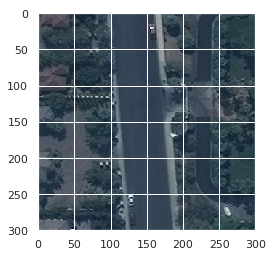

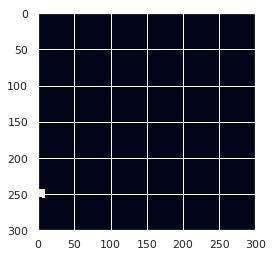

In [137]:
crd = CrowdAI('/datasets/CrowdAI/Train/images/', '/datasets/CrowdAI/Train/labels/')
for i, (x,y) in enumerate(crd):
    if i > 3:
        break
    plt.figure()
    plt.imshow(x)
    plt.figure()
    plt.imshow(y)

In [4]:
def get_statistics(ds, tq=False, lim=None):
    rhist = np.zeros(256)
    ghist = np.zeros(256)
    bhist = np.zeros(256)
    hists = [rhist, ghist, bhist]
    mean = np.zeros(3)
    var = np.zeros(3)
    n = len(ds)
    bins = [i for i in range(257)]
    if tq:
        ds = tqdm(ds)
    for i, (x, _) in enumerate(ds):
        if lim and i > lim:
            break
        channels = cv2.split(x)
        mean += x.mean(axis=(0,1)) / n
        std += x.var(axis=(0,1)) / n
        for ch, h in zip(channels, hists):
            new_h, bins_made = np.histogram(ch.flatten(), bins)
            h += new_h / n
    return hists, mean, var

In [122]:
shists, smean, svar = get_statistics(spc, tq=True)


  7%|▋         | 303/4582 [01:10<16:45,  4.26it/s]


 13%|█▎        | 605/4582 [02:21<16:29,  4.02it/s]


 20%|█▉        | 907/4582 [03:31<14:12,  4.31it/s]


 26%|██▋       | 1205/4582 [04:41<13:43,  4.10it/s]


 33%|███▎      | 1501/4582 [05:49<12:42,  4.04it/s]


 39%|███▉      | 1797/4582 [06:58<12:06,  3.83it/s]


 46%|████▌     | 2093/4582 [08:08<09:57,  4.17it/s]


 52%|█████▏    | 2389/4582 [09:16<08:55,  4.09it/s]


 59%|█████▊    | 2685/4582 [10:26<08:09,  3.88it/s]


 65%|██████▌   | 2981/4582 [11:35<05:35,  4.78it/s]


 72%|███████▏  | 3277/4582 [12:45<05:06,  4.26it/s]


 78%|███████▊  | 3573/4582 [13:54<03:44,  4.49it/s]


 84%|████████▍ | 3869/4582 [15:03<02:31,  4.69it/s]


 91%|█████████ | 4165/4582 [16:11<01:38,  4.25it/s]


 97%|█████████▋| 4461/4582 [17:21<00:26,  4.53it/s]


100%|██████████| 4582/4582 [17:49<00:00,  4.65it/s]

# SpaceNet Summary Statistics

Mean is: [72.55648084 69.98046219 70.46264209]
Standard dev is: [46.87678506 45.43390056 46.00132486]


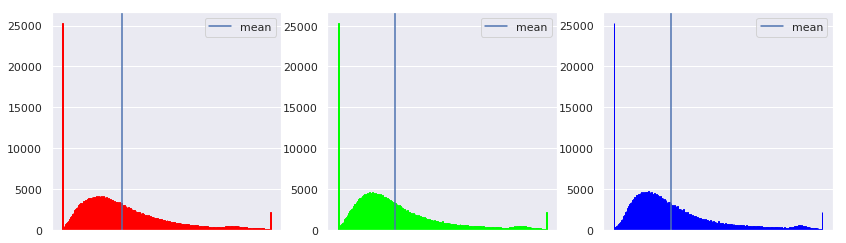

In [130]:
fig, ax = plt.subplots(figsize=(14,4), ncols=3)
bins = np.arange(256)
for i in range(3):
    color = np.zeros(4)
    color[3] = 1
    color[i] = 1
    ax[i].set_xticks([])
    ax[i].bar(bins, hists[i], edgecolor=color)
    ax[i].axvline(x=mean[i], label='mean')
    ax[i].legend()
print("Mean is:", smean)
print("Standard dev is:", svar)
np.savez("spacenet-summary",hists=shists, mean=smean, var=svar)

# CrowdAI Summary Statistics

In [138]:
chists, cmean, cvar = get_statistics(crd, tq=True)


  0%|          | 576/280741 [00:36<5:20:33, 14.57it/s]


  0%|          | 1165/280741 [01:12<4:26:08, 17.51it/s]


  1%|          | 1733/280741 [01:47<4:14:03, 18.30it/s]


  1%|          | 2306/280741 [02:23<4:53:31, 15.81it/s]


  1%|          | 2873/280741 [02:58<4:42:57, 16.37it/s]


  1%|          | 3451/280741 [03:34<4:32:04, 16.99it/s]


  1%|▏         | 4027/280741 [04:11<4:25:29, 17.37it/s]


  2%|▏         | 4594/280741 [04:46<4:56:06, 15.54it/s]


  2%|▏         | 5158/280741 [05:22<4:29:08, 17.07it/s]


  2%|▏         | 5727/280741 [05:58<4:33:46, 16.74it/s]


  2%|▏         | 6294/280741 [06:34<5:08:48, 14.81it/s]


  2%|▏         | 6867/280741 [07:10<4:31:53, 16.79it/s]


  3%|▎         | 7441/280741 [07:46<4:22:51, 17.33it/s]


  3%|▎         | 8020/280741 [08:23<4:06:41, 18.42it/s]


  3%|▎         | 8598/280741 [08:58<5:59:27, 12.62it/s]


  3%|▎         | 9176/280741 [09:32<4:00:51, 18.79it/s]


  3%|▎         | 9740/280741 [10:08<4:03:08, 18.58it/s]


  4%|▎         | 10317/280741 [10:44<4:12:15, 17.87it/s]


  4%|▍         | 10887/280741 [11:19<4:26:00, 16.91it/s]


  4%|▍         | 11448/280741 [11:54<4:22:23, 17.10it/s]


  4%|▍         | 12012/280741 [12:29<4:03:16, 18.41it/s]


  4%|▍         | 12576/280741 [13:04<4:22:51, 17.00it/s]


  5%|▍         | 13138/280741 [13:39<3:51:21, 19.28it/s]


  5%|▍         | 13709/280741 [14:15<4:35:36, 16.15it/s]


  5%|▌         | 14279/280741 [14:50<4:38:15, 15.96it/s]


  5%|▌         | 14846/280741 [15:25<4:49:31, 15.31it/s]


  5%|▌         | 15419/280741 [16:00<4:20:17, 16.99it/s]


  6%|▌         | 15979/280741 [16:36<5:18:47, 13.84it/s]


  6%|▌         | 16559/280741 [17:11<6:17:24, 11.67it/s]


  6%|▌         | 17137/280741 [17:46<4:39:45, 15.70it/s]


  6%|▋         | 17713/280741 [18:21<3:52:02, 18.89it/s]


  7%|▋         | 18286/280741 [18:56<4:30:31, 16.17it/s]


  7%|▋         | 18848/280741 [19:30<4:28:48, 16.24it/s]


  7%|▋         | 19417/280741 [20:05<4:14:41, 17.10it/s]


  7%|▋         | 19981/280741 [20:40<4:23:13, 16.51it/s]


  7%|▋         | 20554/280741 [21:14<4:07:16, 17.54it/s]


  8%|▊         | 21129/280741 [21:49<4:31:31, 15.94it/s]


  8%|▊         | 21696/280741 [22:24<4:22:00, 16.48it/s]


  8%|▊         | 22270/280741 [22:59<4:24:18, 16.30it/s]


  8%|▊         | 22845/280741 [23:34<4:01:04, 17.83it/s]


  8%|▊         | 23423/280741 [24:09<4:01:59, 17.72it/s]


  9%|▊         | 23994/280741 [24:44<4:46:15, 14.95it/s]


  9%|▉         | 24572/280741 [25:19<4:00:34, 17.75it/s]


  9%|▉         | 25148/280741 [25:54<4:16:27, 16.61it/s]


  9%|▉         | 25720/280741 [26:29<3:48:00, 18.64it/s]


  9%|▉         | 26287/280741 [27:05<4:46:05, 14.82it/s]


 10%|▉         | 26855/280741 [27:39<3:54:43, 18.03it/s]


 10%|▉         | 27431/280741 [28:14<4:02:16, 17.43it/s]


 10%|▉         | 27997/280741 [28:49<4:59:44, 14.05it/s]


 10%|█         | 28564/280741 [29:24<4:45:03, 14.74it/s]


 10%|█         | 29122/280741 [30:00<4:11:40, 16.66it/s]


 11%|█         | 29682/280741 [30:34<4:09:59, 16.74it/s]


 11%|█         | 30244/280741 [31:10<4:37:38, 15.04it/s]


 11%|█         | 30799/280741 [31:46<4:38:31, 14.96it/s]


 11%|█         | 31361/280741 [32:22<4:11:15, 16.54it/s]


 11%|█▏        | 31932/280741 [32:57<4:26:25, 15.57it/s]


 12%|█▏        | 32510/280741 [33:33<4:09:02, 16.61it/s]


 12%|█▏        | 33071/280741 [34:08<4:09:12, 16.56it/s]


 12%|█▏        | 33643/280741 [34:44<4:05:59, 16.74it/s]


 12%|█▏        | 34197/280741 [35:19<4:17:52, 15.93it/s]


 12%|█▏        | 34767/280741 [35:55<4:35:16, 14.89it/s]


 13%|█▎        | 35323/280741 [36:30<4:11:39, 16.25it/s]


 13%|█▎        | 35890/280741 [37:05<4:14:33, 16.03it/s]


 13%|█▎        | 36455/280741 [37:41<4:05:29, 16.58it/s]


 13%|█▎        | 37028/280741 [38:16<4:00:43, 16.87it/s]


 13%|█▎        | 37601/280741 [38:51<3:41:49, 18.27it/s]


 14%|█▎        | 38178/280741 [39:25<4:11:21, 16.08it/s]


 14%|█▍        | 38757/280741 [40:01<4:42:27, 14.28it/s]


 14%|█▍        | 39322/280741 [40:36<4:01:56, 16.63it/s]


 14%|█▍        | 39889/280741 [41:11<4:25:51, 15.10it/s]


 14%|█▍        | 40459/280741 [41:46<4:08:34, 16.11it/s]


 15%|█▍        | 41040/280741 [42:21<3:55:31, 16.96it/s]


 15%|█▍        | 41622/280741 [42:57<3:57:18, 16.79it/s]


 15%|█▌        | 42187/280741 [43:32<3:47:44, 17.46it/s]


 15%|█▌        | 42761/280741 [44:07<3:50:45, 17.19it/s]


 15%|█▌        | 43324/280741 [44:41<4:04:02, 16.21it/s]


 16%|█▌        | 43899/280741 [45:16<3:37:00, 18.19it/s]


 16%|█▌        | 44469/280741 [45:51<3:58:00, 16.54it/s]


 16%|█▌        | 45035/280741 [46:26<3:50:05, 17.07it/s]


 16%|█▌        | 45605/280741 [47:01<3:56:26, 16.57it/s]


 16%|█▋        | 46177/280741 [47:36<3:46:39, 17.25it/s]


 17%|█▋        | 46737/280741 [48:11<4:06:05, 15.85it/s]


 17%|█▋        | 47305/280741 [48:46<3:59:53, 16.22it/s]


 17%|█▋        | 47871/280741 [49:21<4:24:31, 14.67it/s]


 17%|█▋        | 48444/280741 [49:56<3:49:45, 16.85it/s]


 17%|█▋        | 49010/280741 [50:31<3:38:37, 17.67it/s]


 18%|█▊        | 49584/280741 [51:06<3:43:36, 17.23it/s]


 18%|█▊        | 50151/280741 [51:41<3:49:02, 16.78it/s]


 18%|█▊        | 50725/280741 [52:17<4:06:46, 15.54it/s]


 18%|█▊        | 51294/280741 [52:51<4:04:21, 15.65it/s]


 18%|█▊        | 51852/280741 [53:26<4:14:18, 15.00it/s]


 19%|█▊        | 52418/280741 [54:02<4:52:55, 12.99it/s]


 19%|█▉        | 52992/280741 [54:37<4:01:06, 15.74it/s]


 19%|█▉        | 53555/280741 [55:13<4:10:47, 15.10it/s]


 19%|█▉        | 54127/280741 [55:48<3:30:57, 17.90it/s]


 19%|█▉        | 54698/280741 [56:23<4:14:09, 14.82it/s]


 20%|█▉        | 55268/280741 [56:58<3:33:34, 17.60it/s]


 20%|█▉        | 55834/280741 [57:33<3:27:47, 18.04it/s]


 20%|██        | 56407/280741 [58:08<3:31:44, 17.66it/s]


 20%|██        | 56972/280741 [58:42<3:26:39, 18.05it/s]


 20%|██        | 57539/280741 [59:17<3:36:38, 17.17it/s]


 21%|██        | 58114/280741 [59:52<3:18:33, 18.69it/s]


 21%|██        | 58664/280741 [1:00:26<4:00:22, 15.40it/s]


 21%|██        | 59212/280741 [1:01:00<3:37:00, 17.01it/s]


 21%|██▏       | 59772/280741 [1:01:34<3:15:56, 18.80it/s]


 21%|██▏       | 60323/280741 [1:02:08<3:37:51, 16.86it/s]


 22%|██▏       | 60883/280741 [1:02:42<3:33:26, 17.17it/s]


 22%|██▏       | 61436/280741 [1:03:16<3:30:01, 17.40it/s]


 22%|██▏       | 61987/280741 [1:03:51<3:48:59, 15.92it/s]


 22%|██▏       | 62535/280741 [1:04:24<3:35:46, 16.85it/s]


 22%|██▏       | 63085/280741 [1:04:59<5:14:41, 11.53it/s]


 23%|██▎       | 63639/280741 [1:05:33<4:15:25, 14.17it/s]


 23%|██▎       | 64188/280741 [1:06:08<6:32:47,  9.19it/s]


 23%|██▎       | 64738/280741 [1:06:41<3:50:07, 15.64it/s]


 23%|██▎       | 65284/280741 [1:07:15<3:25:24, 17.48it/s]


 23%|██▎       | 65842/280741 [1:07:50<3:58:44, 15.00it/s]


 24%|██▎       | 66392/280741 [1:08:24<3:12:56, 18.52it/s]


 24%|██▍       | 66953/280741 [1:08:58<3:56:49, 15.05it/s]


 24%|██▍       | 67501/280741 [1:09:32<3:35:58, 16.46it/s]


 24%|██▍       | 68057/280741 [1:10:06<3:31:14, 16.78it/s]


 24%|██▍       | 68603/280741 [1:10:40<3:34:07, 16.51it/s]


 25%|██▍       | 69162/280741 [1:11:15<3:15:43, 18.02it/s]


 25%|██▍       | 69712/280741 [1:11:49<3:39:41, 16.01it/s]


 25%|██▌       | 70257/280741 [1:12:23<3:21:12, 17.43it/s]


 25%|██▌       | 70801/280741 [1:12:57<3:55:06, 14.88it/s]


 25%|██▌       | 71356/280741 [1:13:31<4:04:15, 14.29it/s]


 26%|██▌       | 71912/280741 [1:14:05<3:18:18, 17.55it/s]


 26%|██▌       | 72460/280741 [1:14:39<3:53:08, 14.89it/s]


 26%|██▌       | 73016/280741 [1:15:14<4:19:11, 13.36it/s]


 26%|██▌       | 73567/280741 [1:15:48<3:18:14, 17.42it/s]


 26%|██▋       | 74122/280741 [1:16:22<3:17:24, 17.44it/s]


 27%|██▋       | 74678/280741 [1:16:57<3:27:48, 16.53it/s]


 27%|██▋       | 75235/280741 [1:17:31<3:20:33, 17.08it/s]


 27%|██▋       | 75797/280741 [1:18:05<3:51:24, 14.76it/s]


 27%|██▋       | 76347/280741 [1:18:40<3:15:46, 17.40it/s]


 27%|██▋       | 76901/280741 [1:19:14<3:27:29, 16.37it/s]


 28%|██▊       | 77455/280741 [1:19:48<3:12:10, 17.63it/s]


 28%|██▊       | 78010/280741 [1:20:22<3:04:59, 18.27it/s]


 28%|██▊       | 78560/280741 [1:20:55<3:34:51, 15.68it/s]


 28%|██▊       | 79114/280741 [1:21:29<3:30:33, 15.96it/s]


 28%|██▊       | 79663/280741 [1:22:04<3:12:29, 17.41it/s]


 29%|██▊       | 80204/280741 [1:22:37<3:03:52, 18.18it/s]


 29%|██▉       | 80755/280741 [1:23:11<3:07:59, 17.73it/s]


 29%|██▉       | 81296/280741 [1:23:45<3:13:06, 17.21it/s]


 29%|██▉       | 81843/280741 [1:24:18<3:39:11, 15.12it/s]


 29%|██▉       | 82391/280741 [1:24:53<3:25:34, 16.08it/s]


 30%|██▉       | 82937/280741 [1:25:26<3:34:46, 15.35it/s]


 30%|██▉       | 83495/280741 [1:26:01<3:01:46, 18.09it/s]


 30%|██▉       | 84042/280741 [1:26:35<3:07:10, 17.52it/s]


 30%|███       | 84594/280741 [1:27:09<3:36:05, 15.13it/s]


 30%|███       | 85149/280741 [1:27:43<3:06:25, 17.49it/s]


 31%|███       | 85701/280741 [1:28:17<3:15:10, 16.65it/s]


 31%|███       | 86255/280741 [1:28:51<3:32:31, 15.25it/s]


 31%|███       | 86804/280741 [1:29:25<3:05:23, 17.43it/s]


 31%|███       | 87356/280741 [1:30:00<3:16:43, 16.38it/s]


 31%|███▏      | 87909/280741 [1:30:34<3:15:34, 16.43it/s]


 32%|███▏      | 88457/280741 [1:31:08<3:29:38, 15.29it/s]


 32%|███▏      | 89013/280741 [1:31:42<3:00:59, 17.66it/s]


 32%|███▏      | 89559/280741 [1:32:16<3:06:42, 17.07it/s]


 32%|███▏      | 90119/280741 [1:32:51<3:34:28, 14.81it/s]


 32%|███▏      | 90668/280741 [1:33:25<2:52:56, 18.32it/s]


 32%|███▏      | 91225/280741 [1:34:00<3:07:37, 16.83it/s]


 33%|███▎      | 91773/280741 [1:34:34<3:11:21, 16.46it/s]


 33%|███▎      | 92329/280741 [1:35:09<3:06:35, 16.83it/s]


 33%|███▎      | 92878/280741 [1:35:43<3:24:33, 15.31it/s]


 33%|███▎      | 93434/280741 [1:36:17<3:18:19, 15.74it/s]


 33%|███▎      | 93986/280741 [1:36:52<3:00:09, 17.28it/s]


 34%|███▎      | 94544/280741 [1:37:26<3:31:26, 14.68it/s]


 34%|███▍      | 95097/280741 [1:38:01<3:03:45, 16.84it/s]


 34%|███▍      | 95639/280741 [1:38:35<2:56:37, 17.47it/s]


 34%|███▍      | 96197/280741 [1:39:09<3:12:27, 15.98it/s]


 34%|███▍      | 96739/280741 [1:39:44<3:28:15, 14.73it/s]


 35%|███▍      | 97285/280741 [1:40:18<3:12:00, 15.92it/s]


 35%|███▍      | 97840/280741 [1:40:53<3:07:39, 16.24it/s]


 35%|███▌      | 98386/280741 [1:41:27<3:05:34, 16.38it/s]


 35%|███▌      | 98930/280741 [1:42:02<3:09:56, 15.95it/s]


 35%|███▌      | 99474/280741 [1:42:36<2:56:14, 17.14it/s]


 36%|███▌      | 100027/280741 [1:43:10<3:14:25, 15.49it/s]


 36%|███▌      | 100564/280741 [1:43:44<3:09:14, 15.87it/s]


 36%|███▌      | 101102/280741 [1:44:17<2:54:06, 17.20it/s]


 36%|███▌      | 101637/280741 [1:44:52<7:39:24,  6.50it/s]


 36%|███▋      | 102185/280741 [1:45:25<2:55:11, 16.99it/s]


 37%|███▋      | 102723/280741 [1:45:59<2:45:08, 17.97it/s]


 37%|███▋      | 103263/280741 [1:46:33<2:48:11, 17.59it/s]


 37%|███▋      | 103807/280741 [1:47:08<3:10:29, 15.48it/s]


 37%|███▋      | 104345/280741 [1:47:42<2:46:06, 17.70it/s]


 37%|███▋      | 104885/280741 [1:48:16<2:56:27, 16.61it/s]


 38%|███▊      | 105425/280741 [1:48:50<3:07:31, 15.58it/s]


 38%|███▊      | 105966/280741 [1:49:24<3:26:16, 14.12it/s]


 38%|███▊      | 106514/280741 [1:49:57<2:44:11, 17.68it/s]


 38%|███▊      | 107055/280741 [1:50:33<3:27:55, 13.92it/s]


 38%|███▊      | 107595/280741 [1:51:06<2:57:20, 16.27it/s]


 39%|███▊      | 108127/280741 [1:51:41<3:05:16, 15.53it/s]


 39%|███▊      | 108670/280741 [1:52:16<2:49:55, 16.88it/s]


 39%|███▉      | 109208/280741 [1:52:50<3:08:27, 15.17it/s]


 39%|███▉      | 109752/280741 [1:53:24<3:06:47, 15.26it/s]


 39%|███▉      | 110295/280741 [1:53:58<3:09:26, 15.00it/s]


 39%|███▉      | 110845/280741 [1:54:32<3:08:41, 15.01it/s]


 40%|███▉      | 111384/280741 [1:55:06<2:48:22, 16.76it/s]


 40%|███▉      | 111932/280741 [1:55:40<2:43:10, 17.24it/s]


 40%|████      | 112468/280741 [1:56:15<2:55:00, 16.03it/s]


 40%|████      | 113020/280741 [1:56:49<2:44:44, 16.97it/s]


 40%|████      | 113567/280741 [1:57:23<2:37:19, 17.71it/s]


 41%|████      | 114106/280741 [1:57:57<2:28:50, 18.66it/s]


 41%|████      | 114646/280741 [1:58:32<3:01:29, 15.25it/s]


 41%|████      | 115186/280741 [1:59:07<2:38:26, 17.41it/s]


 41%|████      | 115715/280741 [1:59:42<3:16:54, 13.97it/s]


 41%|████▏     | 116259/280741 [2:00:17<3:15:14, 14.04it/s]


 42%|████▏     | 116791/280741 [2:00:51<2:46:34, 16.40it/s]


 42%|████▏     | 117330/280741 [2:01:25<2:54:38, 15.59it/s]


 42%|████▏     | 117884/280741 [2:01:59<2:50:11, 15.95it/s]


 42%|████▏     | 118420/280741 [2:02:33<2:43:37, 16.53it/s]


 42%|████▏     | 118962/280741 [2:03:08<2:51:41, 15.70it/s]


 43%|████▎     | 119494/280741 [2:03:42<2:55:20, 15.33it/s]


 43%|████▎     | 120031/280741 [2:04:16<2:53:29, 15.44it/s]


 43%|████▎     | 120574/280741 [2:04:51<2:36:47, 17.02it/s]


 43%|████▎     | 121109/280741 [2:05:25<3:04:50, 14.39it/s]


 43%|████▎     | 121648/280741 [2:05:59<2:54:30, 15.19it/s]


 44%|████▎     | 122185/280741 [2:06:33<2:41:37, 16.35it/s]


 44%|████▎     | 122721/280741 [2:07:07<2:40:24, 16.42it/s]


 44%|████▍     | 123268/280741 [2:07:41<2:40:30, 16.35it/s]


 44%|████▍     | 123812/280741 [2:08:16<2:29:34, 17.49it/s]


 44%|████▍     | 124358/280741 [2:08:49<2:22:24, 18.30it/s]


 44%|████▍     | 124896/280741 [2:09:23<2:36:13, 16.63it/s]


 45%|████▍     | 125430/280741 [2:09:58<2:45:10, 15.67it/s]


 45%|████▍     | 125970/280741 [2:10:32<2:34:33, 16.69it/s]


 45%|████▌     | 126505/280741 [2:11:07<4:07:23, 10.39it/s]


 45%|████▌     | 127047/280741 [2:11:40<2:23:21, 17.87it/s]


 45%|████▌     | 127585/280741 [2:12:14<2:34:25, 16.53it/s]


 46%|████▌     | 128123/280741 [2:12:50<2:35:53, 16.32it/s]


 46%|████▌     | 128661/280741 [2:13:23<4:13:09, 10.01it/s]


 46%|████▌     | 129205/280741 [2:13:57<2:33:46, 16.42it/s]


 46%|████▌     | 129744/280741 [2:14:32<2:23:33, 17.53it/s]


 46%|████▋     | 130286/280741 [2:15:07<3:09:41, 13.22it/s]


 47%|████▋     | 130822/280741 [2:15:41<2:30:47, 16.57it/s]


 47%|████▋     | 131360/280741 [2:16:16<2:37:17, 15.83it/s]


 47%|████▋     | 131908/280741 [2:16:50<2:34:32, 16.05it/s]


 47%|████▋     | 132447/280741 [2:17:23<2:31:04, 16.36it/s]


 47%|████▋     | 132984/280741 [2:17:58<2:15:19, 18.20it/s]


 48%|████▊     | 133531/280741 [2:18:34<2:39:38, 15.37it/s]


 48%|████▊     | 134065/280741 [2:19:08<2:20:08, 17.44it/s]


 48%|████▊     | 134598/280741 [2:19:43<2:59:08, 13.60it/s]


 48%|████▊     | 135146/280741 [2:20:17<2:32:19, 15.93it/s]


 48%|████▊     | 135673/280741 [2:20:52<2:37:50, 15.32it/s]


 49%|████▊     | 136209/280741 [2:21:26<2:51:13, 14.07it/s]


 49%|████▊     | 136744/280741 [2:22:00<2:23:18, 16.75it/s]


 49%|████▉     | 137289/280741 [2:22:34<2:27:40, 16.19it/s]


 49%|████▉     | 137834/280741 [2:23:08<4:36:34,  8.61it/s]


 49%|████▉     | 138375/280741 [2:23:43<2:55:12, 13.54it/s]


 49%|████▉     | 138907/280741 [2:24:17<2:14:40, 17.55it/s]


 50%|████▉     | 139443/280741 [2:24:52<2:17:59, 17.07it/s]


 50%|████▉     | 139982/280741 [2:25:28<2:20:56, 16.65it/s]


 50%|█████     | 140520/280741 [2:26:03<2:37:11, 14.87it/s]


 50%|█████     | 141054/280741 [2:26:38<2:28:26, 15.68it/s]


 50%|█████     | 141596/280741 [2:27:12<3:29:54, 11.05it/s]


 51%|█████     | 142131/280741 [2:27:45<2:19:21, 16.58it/s]


 51%|█████     | 142675/280741 [2:28:20<2:26:03, 15.76it/s]


 51%|█████     | 143207/280741 [2:28:55<2:20:20, 16.33it/s]


 51%|█████     | 143755/280741 [2:29:29<2:11:21, 17.38it/s]


 51%|█████▏    | 144295/280741 [2:30:03<2:15:34, 16.77it/s]


 52%|█████▏    | 144835/280741 [2:30:38<2:28:38, 15.24it/s]


 52%|█████▏    | 145372/280741 [2:31:12<2:13:34, 16.89it/s]


 52%|█████▏    | 145907/280741 [2:31:46<2:10:12, 17.26it/s]


 52%|█████▏    | 146441/280741 [2:32:21<2:19:12, 16.08it/s]


 52%|█████▏    | 146982/280741 [2:32:55<2:30:00, 14.86it/s]


 53%|█████▎    | 147517/280741 [2:33:29<2:22:47, 15.55it/s]


 53%|█████▎    | 148062/280741 [2:34:04<2:19:20, 15.87it/s]


 53%|█████▎    | 148601/280741 [2:34:37<1:52:58, 19.49it/s]


 53%|█████▎    | 149140/280741 [2:35:12<1:57:25, 18.68it/s]


 53%|█████▎    | 149693/280741 [2:35:47<2:13:49, 16.32it/s]


 54%|█████▎    | 150234/280741 [2:36:22<2:17:58, 15.76it/s]


 54%|█████▎    | 150773/280741 [2:36:55<2:23:21, 15.11it/s]


 54%|█████▍    | 151306/280741 [2:37:29<3:50:52,  9.34it/s]


 54%|█████▍    | 151836/280741 [2:38:03<2:17:53, 15.58it/s]


 54%|█████▍    | 152377/280741 [2:38:38<2:06:23, 16.93it/s]


 54%|█████▍    | 152914/280741 [2:39:13<2:02:01, 17.46it/s]


 55%|█████▍    | 153462/280741 [2:39:47<2:10:39, 16.24it/s]


 55%|█████▍    | 153998/280741 [2:40:22<2:23:31, 14.72it/s]


 55%|█████▌    | 154535/280741 [2:40:56<2:07:42, 16.47it/s]


 55%|█████▌    | 155064/280741 [2:41:31<2:06:16, 16.59it/s]


 55%|█████▌    | 155600/280741 [2:42:06<2:17:45, 15.14it/s]


 56%|█████▌    | 156132/280741 [2:42:39<3:49:08,  9.06it/s]


 56%|█████▌    | 156664/280741 [2:43:13<2:01:16, 17.05it/s]


 56%|█████▌    | 157195/280741 [2:43:48<2:09:53, 15.85it/s]


 56%|█████▌    | 157735/280741 [2:44:23<2:16:28, 15.02it/s]


 56%|█████▋    | 158279/280741 [2:44:58<2:06:33, 16.13it/s]


 57%|█████▋    | 158821/280741 [2:45:32<2:08:54, 15.76it/s]


 57%|█████▋    | 159365/280741 [2:46:07<2:07:24, 15.88it/s]


 57%|█████▋    | 159907/280741 [2:46:41<2:06:51, 15.88it/s]


 57%|█████▋    | 160447/280741 [2:47:16<2:03:26, 16.24it/s]


 57%|█████▋    | 160987/280741 [2:47:50<2:02:50, 16.25it/s]


 58%|█████▊    | 161522/280741 [2:48:25<3:08:24, 10.55it/s]


 58%|█████▊    | 162063/280741 [2:48:59<3:46:45,  8.72it/s]


 58%|█████▊    | 162596/280741 [2:49:32<1:58:27, 16.62it/s]


 58%|█████▊    | 163145/280741 [2:50:07<1:59:23, 16.42it/s]


 58%|█████▊    | 163687/280741 [2:50:41<2:10:48, 14.91it/s]


 59%|█████▊    | 164237/280741 [2:51:16<2:01:38, 15.96it/s]


 59%|█████▊    | 164773/280741 [2:51:51<2:05:02, 15.46it/s]


 59%|█████▉    | 165309/280741 [2:52:25<1:55:05, 16.72it/s]


 59%|█████▉    | 165852/280741 [2:52:59<1:45:17, 18.19it/s]


 59%|█████▉    | 166399/280741 [2:53:34<1:54:07, 16.70it/s]


 59%|█████▉    | 166939/280741 [2:54:09<2:05:35, 15.10it/s]


 60%|█████▉    | 167482/280741 [2:54:43<4:05:38,  7.68it/s]


 60%|█████▉    | 168022/280741 [2:55:17<2:01:29, 15.46it/s]


 60%|██████    | 168559/280741 [2:55:52<2:11:22, 14.23it/s]


 60%|██████    | 169104/280741 [2:56:27<1:59:12, 15.61it/s]


 60%|██████    | 169639/280741 [2:57:02<2:00:24, 15.38it/s]


 61%|██████    | 170185/280741 [2:57:36<1:47:04, 17.21it/s]


 61%|██████    | 170724/280741 [2:58:10<2:06:19, 14.51it/s]


 61%|██████    | 171271/280741 [2:58:45<2:00:15, 15.17it/s]


 61%|██████    | 171809/280741 [2:59:19<1:46:10, 17.10it/s]


 61%|██████▏   | 172347/280741 [2:59:54<1:57:59, 15.31it/s]


 62%|██████▏   | 172890/280741 [3:00:28<1:47:12, 16.77it/s]


 62%|██████▏   | 173434/280741 [3:01:03<2:22:42, 12.53it/s]


 62%|██████▏   | 173976/280741 [3:01:38<1:45:07, 16.93it/s]


 62%|██████▏   | 174512/280741 [3:02:12<1:47:01, 16.54it/s]


 62%|██████▏   | 175057/280741 [3:02:46<4:10:34,  7.03it/s]


 63%|██████▎   | 175589/280741 [3:03:20<1:56:19, 15.07it/s]


 63%|██████▎   | 176134/280741 [3:03:54<1:59:38, 14.57it/s]


 63%|██████▎   | 176676/280741 [3:04:28<1:53:02, 15.34it/s]


 63%|██████▎   | 177220/280741 [3:05:03<1:36:59, 17.79it/s]


 63%|██████▎   | 177760/280741 [3:05:38<1:41:28, 16.91it/s]


 64%|██████▎   | 178303/280741 [3:06:13<1:47:14, 15.92it/s]


 64%|██████▎   | 178842/280741 [3:06:47<1:57:39, 14.43it/s]


 64%|██████▍   | 179379/280741 [3:07:22<1:44:06, 16.23it/s]


 64%|██████▍   | 179919/280741 [3:07:56<1:56:39, 14.40it/s]


 64%|██████▍   | 180463/280741 [3:08:30<3:08:52,  8.85it/s]


 64%|██████▍   | 180999/280741 [3:09:04<1:38:25, 16.89it/s]


 65%|██████▍   | 181543/280741 [3:09:38<1:37:45, 16.91it/s]


 65%|██████▍   | 182082/280741 [3:10:13<1:36:37, 17.02it/s]


 65%|██████▌   | 182614/280741 [3:10:48<1:40:45, 16.23it/s]


 65%|██████▌   | 183148/280741 [3:11:22<1:38:28, 16.52it/s]


 65%|██████▌   | 183685/280741 [3:11:57<1:40:47, 16.05it/s]


 66%|██████▌   | 184225/280741 [3:12:32<1:41:15, 15.88it/s]


 66%|██████▌   | 184765/280741 [3:13:07<1:42:52, 15.55it/s]


 66%|██████▌   | 185307/280741 [3:13:40<2:15:41, 11.72it/s]


 66%|██████▌   | 185848/280741 [3:14:14<1:27:18, 18.11it/s]


 66%|██████▋   | 186396/280741 [3:14:49<1:37:19, 16.16it/s]


 67%|██████▋   | 186930/280741 [3:15:25<1:35:22, 16.39it/s]


 67%|██████▋   | 187474/280741 [3:15:59<2:45:15,  9.41it/s]


 67%|██████▋   | 188012/280741 [3:16:34<1:33:57, 16.45it/s]


 67%|██████▋   | 188555/280741 [3:17:09<1:37:22, 15.78it/s]


 67%|██████▋   | 189099/280741 [3:17:43<1:50:44, 13.79it/s]


 68%|██████▊   | 189644/280741 [3:18:17<2:12:46, 11.44it/s]


 68%|██████▊   | 190175/280741 [3:18:50<1:26:20, 17.48it/s]


 68%|██████▊   | 190711/280741 [3:19:25<1:32:08, 16.28it/s]


 68%|██████▊   | 191242/280741 [3:20:00<1:30:41, 16.45it/s]


 68%|██████▊   | 191774/280741 [3:20:34<1:29:27, 16.57it/s]


 69%|██████▊   | 192321/280741 [3:21:08<1:30:57, 16.20it/s]


 69%|██████▊   | 192861/280741 [3:21:43<1:24:56, 17.24it/s]


 69%|██████▉   | 193404/280741 [3:22:18<1:16:44, 18.97it/s]


 69%|██████▉   | 193944/280741 [3:22:53<1:22:05, 17.62it/s]


 69%|██████▉   | 194486/280741 [3:23:28<1:29:35, 16.04it/s]


 69%|██████▉   | 195018/280741 [3:24:02<1:29:19, 15.99it/s]


 70%|██████▉   | 195557/280741 [3:24:38<1:31:34, 15.50it/s]


 70%|██████▉   | 196091/280741 [3:25:12<1:25:38, 16.47it/s]


 70%|███████   | 196626/280741 [3:25:47<1:16:51, 18.24it/s]


 70%|███████   | 197166/280741 [3:26:21<1:33:39, 14.87it/s]


 70%|███████   | 197703/280741 [3:26:55<1:28:56, 15.56it/s]


 71%|███████   | 198238/280741 [3:27:30<1:25:24, 16.10it/s]


 71%|███████   | 198779/280741 [3:28:05<2:32:24,  8.96it/s]


 71%|███████   | 199326/280741 [3:28:37<1:18:46, 17.22it/s]


 71%|███████   | 199872/280741 [3:29:12<1:20:46, 16.69it/s]


 71%|███████▏  | 200416/280741 [3:29:47<1:17:53, 17.19it/s]


 72%|███████▏  | 200953/280741 [3:30:21<1:37:30, 13.64it/s]


 72%|███████▏  | 201489/280741 [3:30:56<1:19:01, 16.71it/s]


 72%|███████▏  | 202025/280741 [3:31:31<1:20:37, 16.27it/s]


 72%|███████▏  | 202566/280741 [3:32:06<1:18:59, 16.49it/s]


 72%|███████▏  | 203098/280741 [3:32:40<1:30:14, 14.34it/s]


 73%|███████▎  | 203637/280741 [3:33:15<1:37:43, 13.15it/s]


 73%|███████▎  | 204171/280741 [3:33:50<2:35:53,  8.19it/s]


 73%|███████▎  | 204715/280741 [3:34:22<1:13:49, 17.16it/s]


 73%|███████▎  | 205257/280741 [3:34:57<1:16:32, 16.44it/s]


 73%|███████▎  | 205801/280741 [3:35:32<1:20:08, 15.58it/s]


 74%|███████▎  | 206345/280741 [3:36:07<1:23:17, 14.89it/s]


 74%|███████▎  | 206884/280741 [3:36:41<1:08:52, 17.87it/s]


 74%|███████▍  | 207426/280741 [3:37:15<1:09:20, 17.62it/s]


 74%|███████▍  | 207972/280741 [3:37:51<1:25:51, 14.13it/s]


 74%|███████▍  | 208509/280741 [3:38:26<1:18:04, 15.42it/s]


 74%|███████▍  | 209049/280741 [3:39:00<1:19:23, 15.05it/s]


 75%|███████▍  | 209586/280741 [3:39:35<1:12:47, 16.29it/s]


 75%|███████▍  | 210128/280741 [3:40:10<1:04:54, 18.13it/s]


 75%|███████▌  | 210662/280741 [3:40:44<1:18:19, 14.91it/s]


 75%|███████▌  | 211209/280741 [3:41:18<1:48:23, 10.69it/s]


 75%|███████▌  | 211747/280741 [3:41:53<1:25:27, 13.46it/s]


 76%|███████▌  | 212299/280741 [3:42:26<1:07:53, 16.80it/s]


 76%|███████▌  | 212829/280741 [3:43:00<1:00:45, 18.63it/s]


 76%|███████▌  | 213361/280741 [3:43:36<1:14:05, 15.16it/s]


 76%|███████▌  | 213889/280741 [3:44:11<59:12, 18.82it/s]  


 76%|███████▋  | 214432/280741 [3:44:45<1:07:47, 16.30it/s]


 77%|███████▋  | 214970/280741 [3:45:20<1:05:52, 16.64it/s]


 77%|███████▋  | 215517/280741 [3:45:55<1:05:08, 16.69it/s]


 77%|███████▋  | 216049/280741 [3:46:29<1:05:15, 16.52it/s]


 77%|███████▋  | 216593/280741 [3:47:04<58:15, 18.35it/s]  


 77%|███████▋  | 217137/280741 [3:47:37<57:14, 18.52it/s]


 78%|███████▊  | 217671/280741 [3:48:14<1:07:04, 15.67it/s]


 78%|███████▊  | 218213/280741 [3:48:48<1:01:07, 17.05it/s]


 78%|███████▊  | 218752/280741 [3:49:23<1:02:34, 16.51it/s]


 78%|███████▊  | 219289/280741 [3:49:58<57:35, 17.79it/s]


 78%|███████▊  | 219824/280741 [3:50:32<1:04:57, 15.63it/s]


 78%|███████▊  | 220366/280741 [3:51:07<3:49:29,  4.38it/s]


 79%|███████▊  | 220910/280741 [3:51:41<57:49, 17.25it/s]  


 79%|███████▉  | 221457/280741 [3:52:16<52:16, 18.90it/s]


 79%|███████▉  | 222002/280741 [3:52:51<1:04:36, 15.15it/s]


 79%|███████▉  | 222552/280741 [3:53:26<1:06:06, 14.67it/s]


 79%|███████▉  | 223095/280741 [3:54:00<1:02:39, 15.33it/s]


 80%|███████▉  | 223634/280741 [3:54:34<53:26, 17.81it/s]


 80%|███████▉  | 224177/280741 [3:55:09<52:59, 17.79it/s]


 80%|████████  | 224739/280741 [3:55:43<1:02:14, 14.99it/s]


 80%|████████  | 225297/280741 [3:56:19<55:15, 16.72it/s]


 80%|████████  | 225852/280741 [3:56:54<56:04, 16.32it/s]


 81%|████████  | 226403/280741 [3:57:29<55:46, 16.24it/s]


 81%|████████  | 226966/280741 [3:58:04<56:27, 15.88it/s]


 81%|████████  | 227520/280741 [3:58:39<52:46, 16.81it/s]


 81%|████████  | 228074/280741 [3:59:14<52:17, 16.79it/s]


 81%|████████▏ | 228623/280741 [3:59:50<52:31, 16.54it/s]


 82%|████████▏ | 229186/280741 [4:00:25<51:37, 16.64it/s]


 82%|████████▏ | 229742/280741 [4:01:00<43:34, 19.51it/s]


 82%|████████▏ | 230306/280741 [4:01:36<58:50, 14.28it/s]


 82%|████████▏ | 230859/280741 [4:02:11<48:34, 17.11it/s]


 82%|████████▏ | 231414/280741 [4:02:46<48:37, 16.91it/s]


 83%|████████▎ | 231963/280741 [4:03:21<53:18, 15.25it/s]


 83%|████████▎ | 232515/280741 [4:03:57<49:57, 16.09it/s]


 83%|████████▎ | 233065/280741 [4:04:33<52:16, 15.20it/s]


 83%|████████▎ | 233633/280741 [4:05:08<1:06:00, 11.89it/s]


 83%|████████▎ | 234190/280741 [4:05:42<55:41, 13.93it/s]


 84%|████████▎ | 234741/280741 [4:06:18<43:32, 17.60it/s]


 84%|████████▍ | 235293/280741 [4:06:53<43:41, 17.34it/s]


 84%|████████▍ | 235850/280741 [4:07:30<43:43, 17.11it/s]


 84%|████████▍ | 236410/280741 [4:08:05<45:04, 16.39it/s]


 84%|████████▍ | 236969/280741 [4:08:41<48:45, 14.96it/s]


 85%|████████▍ | 237527/280741 [4:09:16<46:21, 15.54it/s]


 85%|████████▍ | 238082/280741 [4:09:52<42:50, 16.60it/s]


 85%|████████▌ | 238631/280741 [4:10:27<43:51, 16.00it/s]


 85%|████████▌ | 239188/280741 [4:11:03<41:06, 16.84it/s]


 85%|████████▌ | 239748/280741 [4:11:38<43:33, 15.69it/s]


 86%|████████▌ | 240310/280741 [4:12:14<36:51, 18.29it/s]


 86%|████████▌ | 240869/280741 [4:12:49<1:19:38,  8.34it/s]


 86%|████████▌ | 241427/280741 [4:13:23<39:16, 16.68it/s]


 86%|████████▌ | 241966/280741 [4:13:58<37:41, 17.15it/s]


 86%|████████▋ | 242531/280741 [4:14:34<38:49, 16.41it/s]


 87%|████████▋ | 243080/280741 [4:15:08<38:26, 16.33it/s]


 87%|████████▋ | 243652/280741 [4:15:44<36:56, 16.73it/s]


 87%|████████▋ | 244215/280741 [4:16:20<38:51, 15.67it/s]


 87%|████████▋ | 244779/280741 [4:16:56<34:49, 17.21it/s]


 87%|████████▋ | 245337/280741 [4:17:32<34:30, 17.10it/s]


 88%|████████▊ | 245888/280741 [4:18:07<35:26, 16.39it/s]


 88%|████████▊ | 246440/280741 [4:18:43<33:54, 16.86it/s]


 88%|████████▊ | 246993/280741 [4:19:18<33:04, 17.00it/s]


 88%|████████▊ | 247538/280741 [4:19:54<35:13, 15.71it/s]


 88%|████████▊ | 248097/280741 [4:20:29<36:24, 14.94it/s]


 89%|████████▊ | 248650/280741 [4:21:05<30:01, 17.81it/s]


 89%|████████▉ | 249209/280741 [4:21:39<33:35, 15.64it/s]


 89%|████████▉ | 249763/280741 [4:22:15<30:38, 16.85it/s]


 89%|████████▉ | 250323/280741 [4:22:51<26:42, 18.98it/s]


 89%|████████▉ | 250868/280741 [4:23:26<32:00, 15.55it/s]


 90%|████████▉ | 251426/280741 [4:24:02<28:24, 17.20it/s]


 90%|████████▉ | 251987/280741 [4:24:37<30:13, 15.85it/s]


 90%|████████▉ | 252550/280741 [4:25:10<27:08, 17.31it/s]


 90%|█████████ | 253108/280741 [4:25:47<35:45, 12.88it/s]


 90%|█████████ | 253667/280741 [4:26:21<26:00, 17.35it/s]


 91%|█████████ | 254221/280741 [4:26:56<26:54, 16.43it/s]


 91%|█████████ | 254785/280741 [4:27:33<29:33, 14.63it/s]


 91%|█████████ | 255348/280741 [4:28:08<25:36, 16.53it/s]


 91%|█████████ | 255894/280741 [4:28:43<25:28, 16.26it/s]


 91%|█████████▏| 256452/280741 [4:29:18<21:49, 18.55it/s]


 92%|█████████▏| 257010/280741 [4:29:54<24:41, 16.02it/s]


 92%|█████████▏| 257559/280741 [4:30:29<22:48, 16.93it/s]


 92%|█████████▏| 258119/280741 [4:31:05<22:07, 17.04it/s]


 92%|█████████▏| 258676/280741 [4:31:40<23:07, 15.91it/s]


 92%|█████████▏| 259230/280741 [4:32:14<34:13, 10.48it/s]


 93%|█████████▎| 259788/280741 [4:32:49<20:28, 17.06it/s]


 93%|█████████▎| 260355/280741 [4:33:25<20:39, 16.45it/s]


 93%|█████████▎| 260910/280741 [4:34:00<20:13, 16.34it/s]


 93%|█████████▎| 261465/280741 [4:34:36<18:04, 17.78it/s]


 93%|█████████▎| 262018/280741 [4:35:11<19:33, 15.95it/s]


 94%|█████████▎| 262582/280741 [4:35:47<19:04, 15.87it/s]


 94%|█████████▎| 263149/280741 [4:36:23<17:21, 16.90it/s]


 94%|█████████▍| 263710/280741 [4:36:59<17:52, 15.88it/s]


 94%|█████████▍| 264263/280741 [4:37:34<15:59, 17.18it/s]


 94%|█████████▍| 264816/280741 [4:38:10<15:52, 16.72it/s]


 95%|█████████▍| 265367/280741 [4:38:46<17:02, 15.03it/s]


 95%|█████████▍| 265924/280741 [4:39:21<14:06, 17.51it/s]


 95%|█████████▍| 266488/280741 [4:39:56<14:18, 16.61it/s]


 95%|█████████▌| 267044/280741 [4:40:31<13:20, 17.11it/s]


 95%|█████████▌| 267599/280741 [4:41:07<13:26, 16.29it/s]


 96%|█████████▌| 268158/280741 [4:41:42<14:58, 14.01it/s]


 96%|█████████▌| 268717/280741 [4:42:18<12:44, 15.73it/s]


 96%|█████████▌| 269274/280741 [4:42:53<11:31, 16.58it/s]


 96%|█████████▌| 269832/280741 [4:43:28<10:27, 17.39it/s]


 96%|█████████▋| 270389/280741 [4:44:05<10:52, 15.87it/s]


 97%|█████████▋| 270936/280741 [4:44:40<09:59, 16.34it/s]


 97%|█████████▋| 271494/280741 [4:45:16<08:47, 17.54it/s]


 97%|█████████▋| 272057/280741 [4:45:52<11:31, 12.55it/s]


 97%|█████████▋| 272610/280741 [4:46:27<10:10, 13.32it/s]


 97%|█████████▋| 273168/280741 [4:47:00<07:19, 17.22it/s]


 98%|█████████▊| 273724/280741 [4:47:36<07:40, 15.23it/s]


 98%|█████████▊| 274289/280741 [4:48:12<06:14, 17.21it/s]


 98%|█████████▊| 274850/280741 [4:48:47<05:49, 16.84it/s]


 98%|█████████▊| 275414/280741 [4:49:22<04:43, 18.80it/s]


 98%|█████████▊| 275961/280741 [4:49:58<04:41, 17.01it/s]


 98%|█████████▊| 276517/280741 [4:50:34<04:21, 16.18it/s]


 99%|█████████▊| 277073/280741 [4:51:10<03:42, 16.47it/s]


 99%|█████████▉| 277625/280741 [4:51:45<03:20, 15.53it/s]


 99%|█████████▉| 278175/280741 [4:52:21<02:38, 16.15it/s]


 99%|█████████▉| 278732/280741 [4:52:56<02:01, 16.48it/s]


 99%|█████████▉| 279293/280741 [4:53:32<01:23, 17.43it/s]


100%|█████████▉| 279847/280741 [4:54:08<00:49, 18.22it/s]


100%|█████████▉| 280399/280741 [4:54:43<00:32, 10.53it/s]


100%|██████████| 280741/280741 [4:55:04<00:00, 15.86it/s]

In [139]:
np.savez('crowdai-summary', hists=chists, mean=cmean, std=cvar)

Mean is: [ 77.79408427  89.68194542 101.41694189]
Standard dev is: [36.39705684 33.36749231 30.86501904]


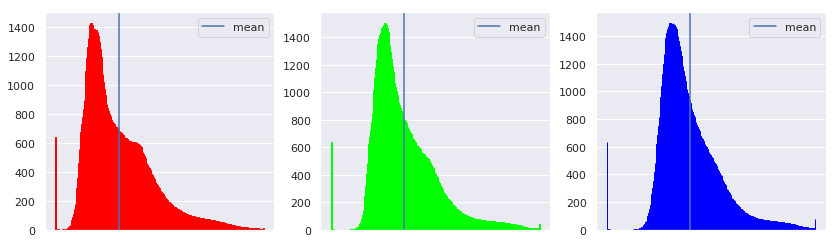

In [140]:
fig, ax = plt.subplots(figsize=(14,4), ncols=3)
bins = np.arange(256)
for i in range(3):
    color = np.zeros(4)
    color[3] = 1
    color[i] = 1
    ax[i].set_xticks([])
    ax[i].bar(bins, chists[i], edgecolor=color)
    ax[i].axvline(x=cmean[i], label='mean')
    ax[i].legend()
print("Mean is:", cmean)
print("Standard dev is:", cvar)

# Urban3D Summary Statistics

In [5]:
class Urban3D(Dataset, torch.utils.data.Dataset):
    def __init__(self, imdir, lbldir):
        Dataset.__init__(self, imdir, lbldir)
    
    def _convert(self, im_name):
        return im_name.replace('RGB', 'GTL')
    
    def load_lbl(self, lbl_name):
        return georaster.SingleBandRaster(lbl_name).r - 2
    
    def load_im(self, im_name):
        return load_tiff(im_name)
    
    def __getitem__(self, index):
        name = [x for x in os.listdir(self.imdir) if x.endswith("RGB.tif")][index]
        imname = os.path.join(self.imdir, name)
        lblname = os.path.join(self.lbldir, self._convert(name))
        return self.load_im(imname), self.load_lbl(lblname)
    
    def __len__(self):
        return len([x for x in os.listdir(self.imdir) if x.endswith("RGB.tif")])
    
class Urban3D_Histograms(Urban3D):
    def __init__(self, imdir):
        Urban3D.__init__(self, imdir, "")
    
    def __getitem__(self, index):
        name = [x for x in os.listdir(self.imdir) if x.endswith("RGB.tif")][index]
        imname = os.path.join(self.imdir, name)
        img = self.load_im(imname)
        bins = [i for i in range(257)]
        h = []
        mean = np.mean(img, axis=(0,1))
        std = np.std(img, axis=(0,1))
        for ch in cv2.split(img):
            h.append(np.histogram(ch, bins))
        return [h, mean, std], None

In [6]:
u3d = Urban3D('../../Train/Inputs/', '../../Train/GT/')
u3d_loader = torch.utils.data.DataLoader(u3d, batch_size=2, num_workers=4)

In [7]:
umean = 0
uvar = 0
uhists = np.zeros((3, 256))
bins = list(range(257))
n = len(u3d_loader)
for i, (x, y) in tqdm(enumerate(u3d_loader), total=n): 
    del(y)
    x = x.numpy()
    h = np.zeros((3, 256))
    for i in range(3):
        h[i] = np.histogram(x[..., i].flatten(), bins)[0]
    umean += 2/n * x.mean(axis=(0,1,2))
    uvar += 2/n * x.var(axis=(0,1,2))
    uhists += 2/n * h

100%|██████████| 87/87 [01:56<00:00,  1.30s/it]


In [8]:
np.savez("urban3d-summary", hists=uhists, mean=umean, var=uvar)

Mean is: [202.60747914 204.23540725 166.04711958]
Standard dev is: [5049.65872384 4308.28606552 4174.3828115 ]


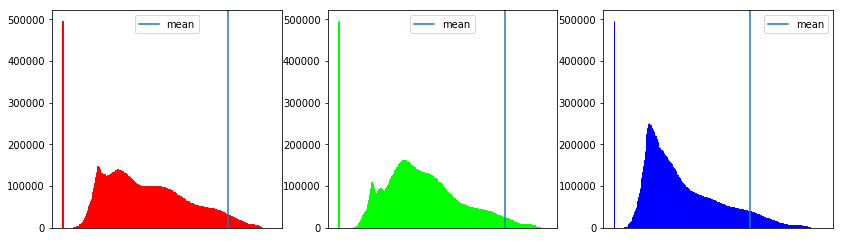

In [10]:
fig, ax = plt.subplots(figsize=(14,4), ncols=3)
bins = np.arange(256)
for i in range(3):
    color = np.zeros(4)
    color[3] = 1
    color[i] = 1
    ax[i].set_xticks([])
    ax[i].bar(bins, uhists[i], edgecolor=color)
    ax[i].axvline(x=umean[i], label='mean')
    ax[i].legend()
print("Mean is:", umean)
print("Standard dev is:", uvar)

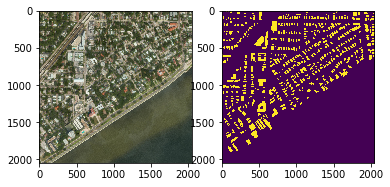

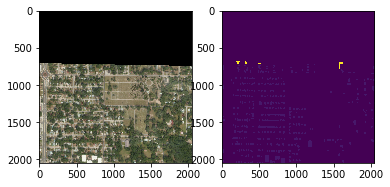

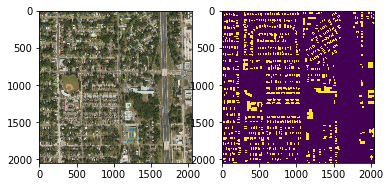

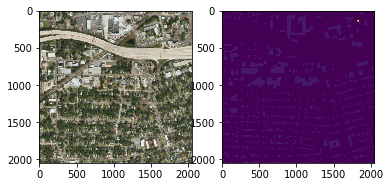

In [12]:
for i in range(4):
    x, y = u3d[i]
    fig, ax = plt.subplots(figsize=(6, 4), ncols=2)
    ax[0].imshow(x)
    ax[1].imshow(y)

In [32]:
len(u3d)

174

In [34]:
! ls ../../Train/Inputs/ | grep "RGB" | wc -l

174
